In [0]:
from pyspark.sql import SparkSession

# Create a Spark session
spark = SparkSession.builder \
    .appName("Crime Analytics in India") \
    .getOrCreate()


In [0]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
# Define the S3 bucket and file path
bucket_name = "bigdataprojectty"
file_path = "rajanand-crime-in-india/01_District_wise_crimes_committed_IPC_2001_2012.csv"

# Load the CSV file into a DataFrame
DistrictWiseCrimesIPC2001_2012_df = (
    spark.read
    .format("csv")
    .option("header", "true")
    .load(f"s3://{bucket_name}/{file_path}")
)

# Display the DataFrame (optional)
display(DistrictWiseCrimesIPC2001_2012_df)


STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,DACOITY,PREPARATION AND ASSEMBLY FOR DACOITY,ROBBERY,BURGLARY,THEFT,AUTO THEFT,OTHER THEFT,RIOTS,CRIMINAL BREACH OF TRUST,CHEATING,COUNTERFIETING,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,30,16,9,0,41,198,199,22,177,78,16,104,1,30,1131,16,149,34,175,0,181,1518,4154
ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,30,23,8,0,16,191,366,57,309,168,11,65,8,69,1543,7,118,24,154,0,270,754,4125
ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,34,25,4,0,14,237,723,164,559,156,33,209,9,38,2088,14,112,83,186,0,404,1262,5818
ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,20,5,1,0,4,98,173,36,137,164,12,37,2,23,795,17,126,38,57,0,233,1181,3140
ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,26,23,4,0,25,437,1021,150,871,70,50,220,3,41,1244,12,109,58,247,0,431,2313,6507
ANDHRA PRADESH,GUNTAKAL RLY.,2001,3,1,0,0,0,0,0,0,0,5,0,2,0,162,0,162,1,0,0,3,0,1,0,1,0,0,0,4,104,287
ANDHRA PRADESH,GUNTUR,2001,182,88,2,54,0,54,82,51,31,16,3,59,338,1122,171,951,244,67,300,8,43,1792,7,139,129,378,0,369,2426,7848
ANDHRA PRADESH,HYDERABAD CITY,2001,111,113,7,37,0,37,80,39,41,13,0,67,1155,2792,1128,1664,65,101,1293,24,0,3137,24,118,27,746,0,409,1512,11831
ANDHRA PRADESH,KARIMNAGAR,2001,162,85,6,56,0,56,67,49,18,27,1,50,218,392,54,338,220,25,243,5,33,1392,62,414,81,224,0,322,1726,5811
ANDHRA PRADESH,KHAMMAM,2001,93,60,1,47,0,47,41,30,11,1,0,13,172,368,34,334,153,35,130,5,73,1026,17,180,336,172,0,209,1450,4582


In [0]:

# Drop duplicate rows if any
DistrictWiseCrimesIPC2001_2012_df = DistrictWiseCrimesIPC2001_2012_df.dropDuplicates()



In [0]:
from pyspark.sql.functions import sum, col

# Convert columns to integer if they are in string format
yearly_trends = DistrictWiseCrimesIPC2001_2012_df.withColumn("MURDER", col("MURDER").cast("int")) \
    .withColumn("ATTEMPT TO MURDER", col("ATTEMPT TO MURDER").cast("int")) \
    .groupBy("YEAR") \
    .agg(
        sum("MURDER").alias("Total Murder"),
        sum("ATTEMPT TO MURDER").alias("Total Attempt to Murder")
    ) \
    .orderBy("YEAR")

yearly_trends.show()


+----+------------+-----------------------+
|YEAR|Total Murder|Total Attempt to Murder|
+----+------------+-----------------------+
|2001|       72404|                  63046|
|2002|       70580|                  60760|
|2003|       65432|                  51884|
|2004|       67216|                  55780|
|2005|       65438|                  56062|
|2006|       64962|                  54460|
|2007|       64636|                  54802|
|2008|       65532|                  57196|
|2009|       64738|                  58076|
|2010|       66670|                  58842|
|2011|       68610|                  62770|
|2012|       68868|                  70276|
+----+------------+-----------------------+



In [0]:
from pyspark.sql.functions import col

# List of columns to convert to integer
columns_to_convert = [
    "MURDER", "ATTEMPT TO MURDER", "CULPABLE HOMICIDE NOT AMOUNTING TO MURDER", 
    "RAPE", "CUSTODIAL RAPE", "OTHER RAPE", "KIDNAPPING & ABDUCTION", 
    "KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS", "KIDNAPPING AND ABDUCTION OF OTHERS", 
    "DACOITY", "PREPARATION AND ASSEMBLY FOR DACOITY", "ROBBERY", 
    "BURGLARY", "THEFT", "AUTO THEFT", "OTHER THEFT", 
    "RIOTS", "CRIMINAL BREACH OF TRUST", "CHEATING", "COUNTERFIETING", 
    "ARSON", "HURT/GREVIOUS HURT", "DOWRY DEATHS", 
    "ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY", 
    "INSULT TO MODESTY OF WOMEN", "CRUELTY BY HUSBAND OR HIS RELATIVES", 
    "IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES", 
    "CAUSING DEATH BY NEGLIGENCE", "OTHER IPC CRIMES", "TOTAL IPC CRIMES"
]

# Convert relevant columns to integer
for column in columns_to_convert:
    DistrictWiseCrimesIPC2001_2012_df = DistrictWiseCrimesIPC2001_2012_df.withColumn(column, col(column).cast("int"))

# Show the updated DataFrame
DistrictWiseCrimesIPC2001_2012_df.show()


+--------------+-----------------+----+------+-----------------+-----------------------------------------+----+--------------+----------+----------------------+-------------------------------------------+----------------------------------+-------+------------------------------------+-------+--------+-----+----------+-----------+-----+------------------------+--------+--------------+-----+------------------+------------+---------------------------------------------------+--------------------------+-----------------------------------+-------------------------------------------+---------------------------+----------------+----------------+
|      STATE/UT|         DISTRICT|YEAR|MURDER|ATTEMPT TO MURDER|CULPABLE HOMICIDE NOT AMOUNTING TO MURDER|RAPE|CUSTODIAL RAPE|OTHER RAPE|KIDNAPPING & ABDUCTION|KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS|KIDNAPPING AND ABDUCTION OF OTHERS|DACOITY|PREPARATION AND ASSEMBLY FOR DACOITY|ROBBERY|BURGLARY|THEFT|AUTO THEFT|OTHER THEFT|RIOTS|CRIMINAL BREACH OF 

In [0]:
from pyspark.sql.functions import col

# Ensure columns are cast to integer
DistrictWiseCrimesIPC2001_2012_df = DistrictWiseCrimesIPC2001_2012_df.withColumn("MURDER", col("MURDER").cast("int"))
DistrictWiseCrimesIPC2001_2012_df = DistrictWiseCrimesIPC2001_2012_df.withColumn("ATTEMPT TO MURDER", col("ATTEMPT TO MURDER").cast("int"))

# Calculate the correlation between 'MURDER' and 'ATTEMPT TO MURDER'
correlation_value = DistrictWiseCrimesIPC2001_2012_df.stat.corr("MURDER", "ATTEMPT TO MURDER")

# Print the correlation result
print(f"Correlation between Murder and Attempt to Murder: {correlation_value}")


Correlation between Murder and Attempt to Murder: 0.958119544116458


In [0]:
# Group by year and sum the total IPC crimes
total_crimes_by_year = DistrictWiseCrimesIPC2001_2012_df.groupBy("YEAR").agg({"TOTAL IPC CRIMES": "sum"}).orderBy("YEAR")

# Convert to Pandas for visualization
total_crimes_pd = total_crimes_by_year.toPandas()


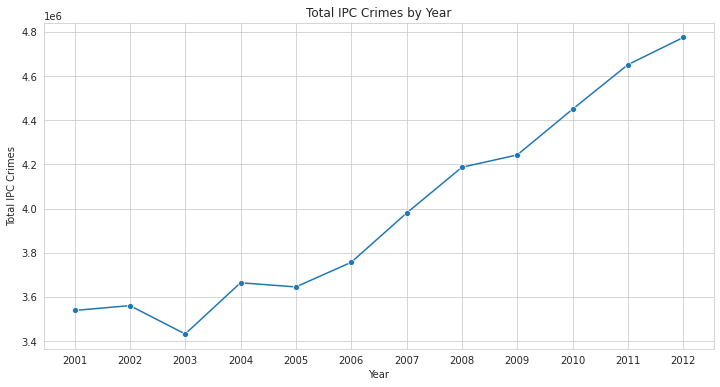

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Plot the total IPC crimes by year
plt.figure(figsize=(12, 6))
sns.lineplot(data=total_crimes_pd, x="YEAR", y="sum(TOTAL IPC CRIMES)", marker='o')
plt.title("Total IPC Crimes by Year")
plt.xlabel("Year")
plt.ylabel("Total IPC Crimes")
plt.xticks(total_crimes_pd['YEAR'].unique())  # Ensure all years are shown
plt.show()


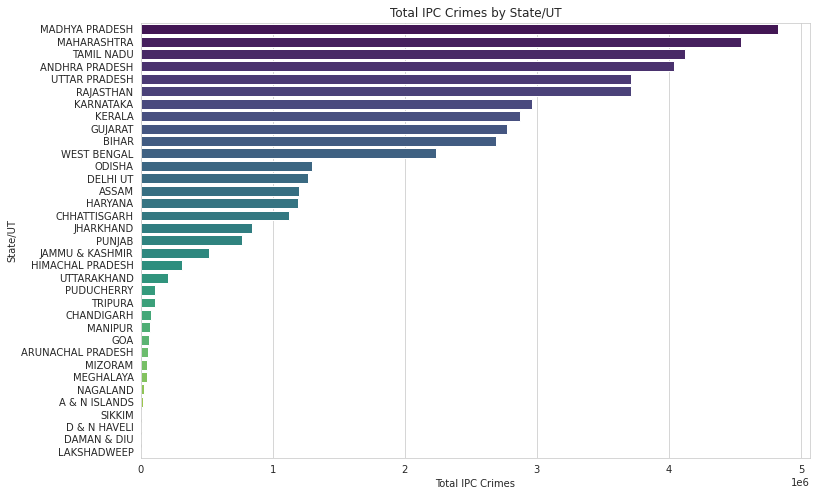

In [0]:
# Group by STATE/UT and sum the total IPC crimes
total_crimes_by_state = DistrictWiseCrimesIPC2001_2012_df.groupBy("STATE/UT").agg({"TOTAL IPC CRIMES": "sum"}).orderBy("sum(TOTAL IPC CRIMES)", ascending=False)

# Convert to Pandas for visualization
total_crimes_state_pd = total_crimes_by_state.toPandas()

# Plot the total IPC crimes by State/UT
plt.figure(figsize=(12, 8))
sns.barplot(data=total_crimes_state_pd, x="sum(TOTAL IPC CRIMES)", y="STATE/UT", palette="viridis")
plt.title("Total IPC Crimes by State/UT")
plt.xlabel("Total IPC Crimes")
plt.ylabel("State/UT")
plt.show()


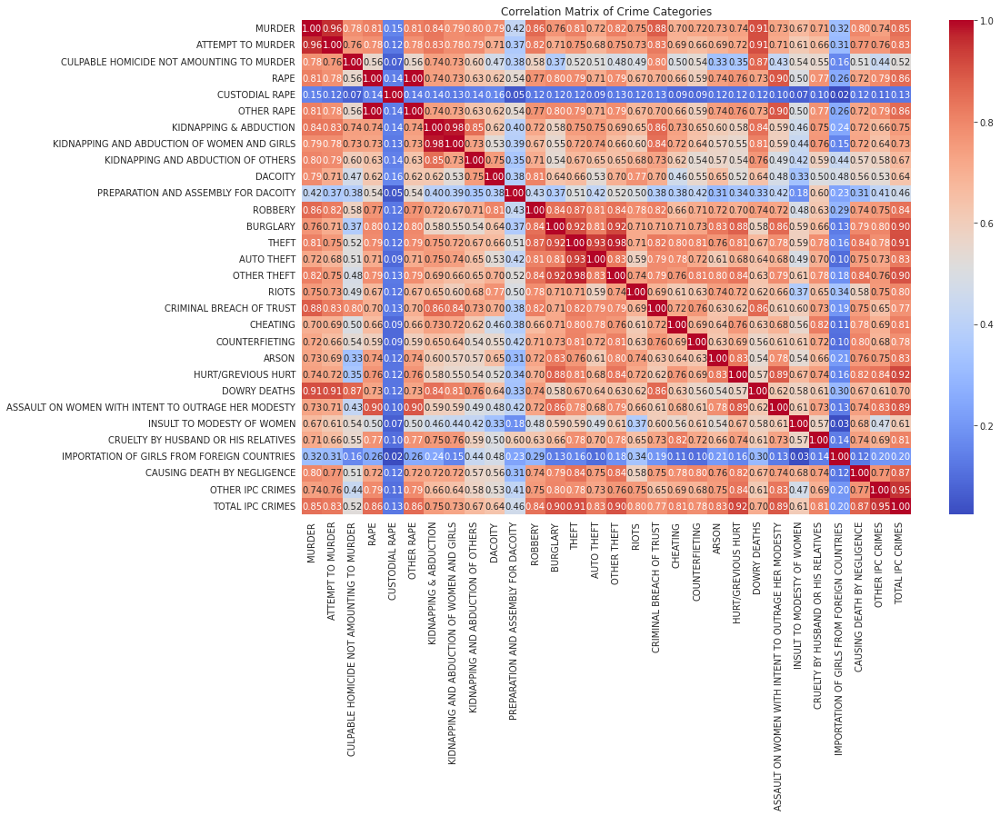

In [0]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Check for missing data in relevant columns
DistrictWiseCrimesIPC2001_2012_df = DistrictWiseCrimesIPC2001_2012_df.select(*columns_to_convert)

# Drop rows with any missing values (if any)
DistrictWiseCrimesIPC2001_2012_df = DistrictWiseCrimesIPC2001_2012_df.dropna()

# Step 2: Convert to pandas DataFrame and calculate the correlation matrix
correlation_matrix = DistrictWiseCrimesIPC2001_2012_df.toPandas().corr()

# Step 3: Plot the correlation heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Matrix of Crime Categories")
plt.show()


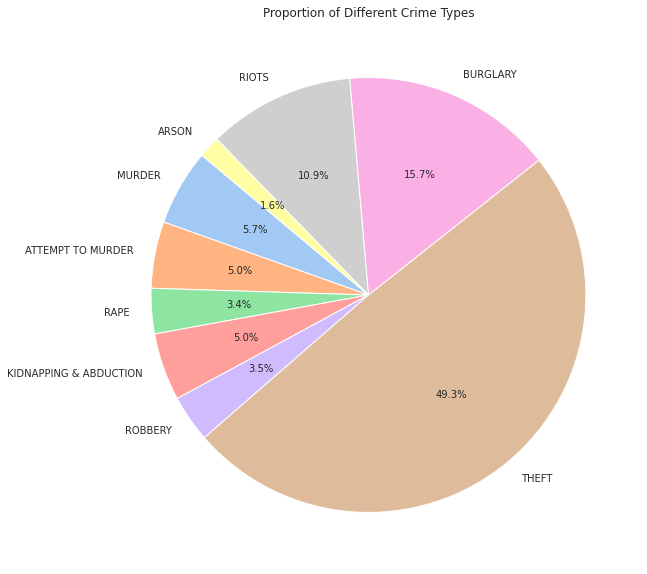

In [0]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, sum

# Assuming crime_categories is a list of relevant crime columns
# For example:
crime_categories = [
    "MURDER", "ATTEMPT TO MURDER", "RAPE", "KIDNAPPING & ABDUCTION", 
    "ROBBERY", "THEFT", "BURGLARY", "RIOTS", "ARSON"
]

# Sum the total crimes across all districts and years for each category
total_crime_counts = DistrictWiseCrimesIPC2001_2012_df.agg(
    *[sum(col(c)).alias(c) for c in crime_categories]
).toPandas()

# Step 2: Plotting the pie chart
plt.figure(figsize=(10, 10))

# Extract the first row (total counts of each crime type) and plot pie chart
plt.pie(total_crime_counts.iloc[0], 
        labels=crime_categories, 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=sns.color_palette("pastel"))

plt.title("Proportion of Different Crime Types")
plt.show()


In [0]:
# Define the S3 bucket and file path
bucket_name = "bigdataprojectty"
file_path = "rajanand-crime-in-india/03_District_wise_crimes_committed_against_children_2001_2012.csv"

# Load the CSV file into a DataFrame
crimes_against_children_df = (
    spark.read
    .format("csv")
    .option("header", "true")
    .load(f"s3://{bucket_name}/{file_path}")
)


In [0]:
# List of crime categories
crime_categories = ['Murder', 'Rape', 'Kidnapping and Abduction', 'Foeticide', 'Abetment of suicide',
                    'Exposure and abandonment', 'Procuration of minor girls', 'Buying of girls for prostitution',
                    'Selling of girls for prostitution', 'Prohibition of child marriage act', 'Other Crimes']

# Calculate total crimes for each category
total_crimes = crimes_against_children_df.select(*crime_categories).groupBy().sum().toPandas()

# Convert the first row to a list for plotting
total_crime_values = total_crimes.iloc[0].tolist()


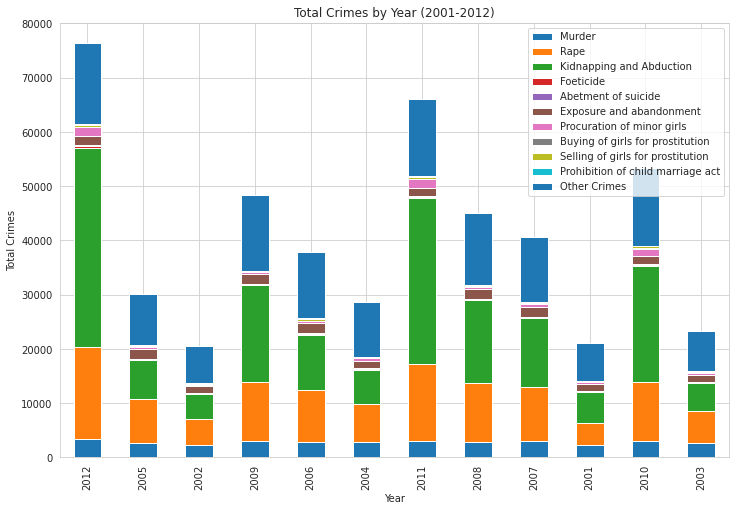

In [0]:
# Sum crimes by year
crimes_by_year = crimes_against_children_df.groupBy("Year").agg(
    *[sum(col(c)).alias(c) for c in crime_categories]
).toPandas()

# Plotting total crimes by year for visualization
crimes_by_year.set_index("Year").plot(kind="bar", stacked=True, figsize=(12, 8))
plt.title("Total Crimes by Year (2001-2012)")
plt.xlabel("Year")
plt.ylabel("Total Crimes")
plt.show()


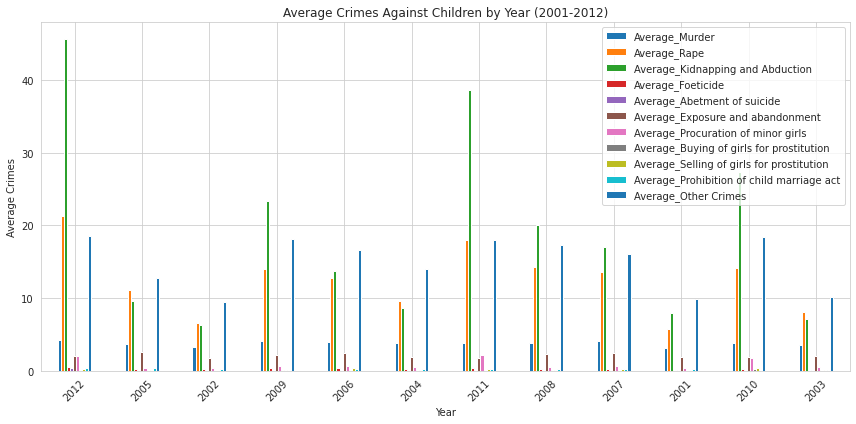

In [0]:
# Calculate annual average crimes
average_crimes_by_year = crimes_against_children_df.groupBy("Year").agg(
    *[F.avg(col(c)).alias(f"Average_{c}") for c in crime_categories]
).toPandas()

# Plotting average crimes by year for visualization
average_crimes_by_year.set_index("Year").plot(kind="bar", figsize=(12, 6))
plt.title("Average Crimes Against Children by Year (2001-2012)")
plt.xlabel("Year")
plt.ylabel("Average Crimes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


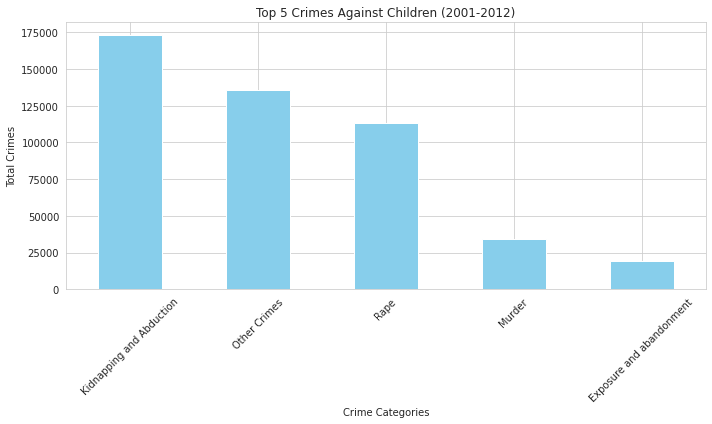

In [0]:
# Calculate total crimes for each category
total_crimes_by_category = crimes_against_children_df.select(crime_categories).agg(
    *[F.sum(col(c)).alias(c) for c in crime_categories]
).toPandas()

# Sum across all years
total_crimes_by_category = total_crimes_by_category.sum().sort_values(ascending=False)

# Plotting top 5 crime categories
top_5_crimes = total_crimes_by_category.head(5)

plt.figure(figsize=(10, 6))
top_5_crimes.plot(kind='bar', color='skyblue')
plt.title("Top 5 Crimes Against Children (2001-2012)")
plt.xlabel("Crime Categories")
plt.ylabel("Total Crimes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


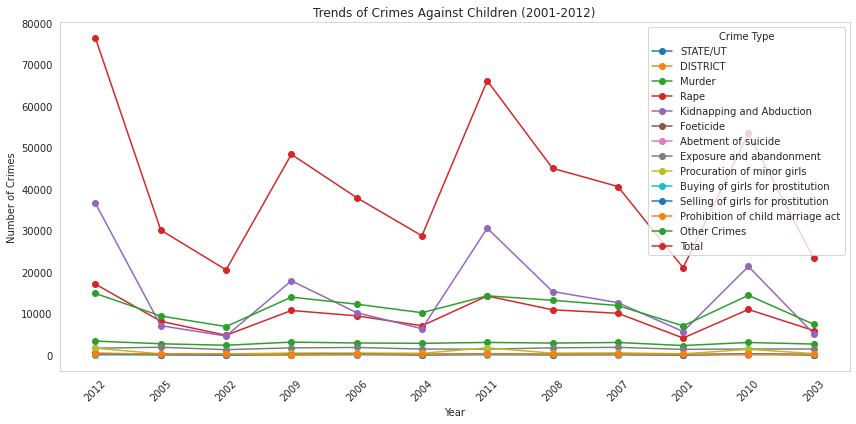

In [0]:
# Plotting trends of specific crimes over the years
plt.figure(figsize=(12, 6))

# Plot each crime type
for crime in crimes_against_children_df.columns:
    if crime != "Year":
        plt.plot(crimes_by_year["Year"], crimes_by_year[crime], marker='o', label=crime)

plt.title("Trends of Crimes Against Children (2001-2012)")
plt.xlabel("Year")
plt.ylabel("Number of Crimes")
plt.xticks(rotation=45)
plt.legend(title='Crime Type')
plt.grid()
plt.tight_layout()
plt.show()


Year with Maximum Crimes: 2012 with 305376.0 total crimes.


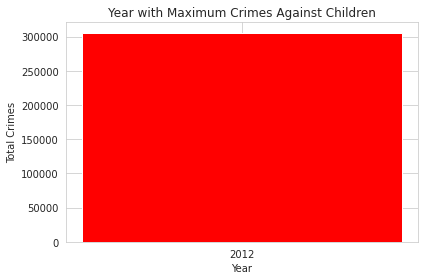

In [0]:
# Ensure only numeric columns are summed
numeric_cols = crimes_by_year.select_dtypes(include=['float64', 'int64']).columns

# Create a new column for total crimes
crimes_by_year['Total_Crimes'] = crimes_by_year[numeric_cols].sum(axis=1)

# Find the year with the maximum total crimes
max_crimes_year = crimes_by_year.loc[crimes_by_year['Total_Crimes'].idxmax()]

print(f"Year with Maximum Crimes: {max_crimes_year['Year']} with {max_crimes_year['Total_Crimes']} total crimes.")

# Plotting the maximum year
plt.figure(figsize=(6, 4))
plt.bar(max_crimes_year['Year'], max_crimes_year['Total_Crimes'], color='red')
plt.title(f"Year with Maximum Crimes Against Children")
plt.xlabel("Year")
plt.ylabel("Total Crimes")
plt.tight_layout()
plt.show()
